In [15]:
from cached_property import cached_property

class B:
    def __init__(self, value):
        self.value = value

class myClass:
    def __init__(self, b):
        self.b = [b]

    @cached_property
    def b_squared(self):
        return self.b[0].value ** 2



b = B(3)

my_instance = myClass(b)

print(my_instance.b_squared)  # Outputs: 9

b.value = 4

print(my_instance.b_squared)  # Still outputs: 9, because it's cached

my_instance.b[0].value = 5

print(my_instance.b_squared)

9
9
9


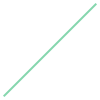

In [16]:
shapely.LineString([(0,0), (1,1)])

In [1]:
import scenic
from scenic.syntax.veneer import localPath
from scenic.core.regions import MeshVolumeRegion
from rulebook_benchmark.realization import Realization
import random
from scenic.simulators.metadrive import MetaDriveSimulator
from rulebook_benchmark.process_trajectory import process_trajectory, process_trajectory_old
import shapely
import matplotx
import shapely.plotting
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import rc
from scenic.core.vectors import Vector
from shapely.plotting import plot_polygon

from rulebook_benchmark.rule_functions import (
    f1,
    f2,
    f3,
    f4,
    f5,
    f6,
    f7,
    f8,
    f9,
    f11,
    f12,
    f12,
    f13,
    
    f15,
    f17,
    f18,

)

from reasonable_crowd.parse_trajectory import parse_trajectory
from reasonable_crowd.parse_map import parse_map



/Users/ekin/Scenic/src/scenic/core/errors.py:271: UserWarning: unable to install sys.excepthook to format Scenic backtraces
  warnings.warn("unable to install sys.excepthook to format Scenic backtraces")
INFO:numexpr.utils:Note: NumExpr detected 10 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


Only need to do this part once

In [2]:
path_to_reasonable_crowd = "../../../Reasonable-Crowd"
map_directory = path_to_reasonable_crowd + '/maps'
trajectory_directory = path_to_reasonable_crowd + '/trajectories'

network_U = parse_map(map_directory, 'U')
network_S = parse_map(map_directory, 'S')

You do this for each trajectory

In [3]:
import cProfile, pstats
profiler = cProfile.Profile()
profiler.enable()

realization = parse_trajectory(trajectory_directory + '/U_1-g.json', step_size=100000)
realization.network = network_U
process_trajectory(realization)


profiler.disable()
stats = pstats.Stats(profiler).sort_stats("cumtime")
stats.print_stats(30)  # top 30 slowest calls

         195124 function calls (194984 primitive calls) in 0.525 seconds

   Ordered by: cumulative time
   List reduced from 219 to 30 due to restriction <30>

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        4    0.000    0.000    0.525    0.131 /opt/anaconda3/envs/benchmark/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3472(run_code)
        4    0.000    0.000    0.525    0.131 {built-in method builtins.exec}
        1    0.021    0.021    0.480    0.480 /var/folders/08/4xhb8kqd27qggxbyxp4t9g3w0000gn/T/ipykernel_33275/168103132.py:5(<module>)
        1    0.000    0.000    0.460    0.460 /Users/ekin/rulebook_benchmark/src/reasonable_crowd/parse_trajectory.py:117(parse_trajectory)
        1    0.000    0.000    0.460    0.460 /Users/ekin/rulebook_benchmark/src/reasonable_crowd/parse_trajectory.py:25(__init__)
        1    0.431    0.431    0.435    0.435 {orjson.loads}
        1    0.000    0.000    0.044    0.044 /var/folders/08/4xhb8kq

In [46]:
ego = realization.get_ego()
obj = realization.objects[1]
print(obj.trajectory[0])
print(len(realization))

186


In [47]:
from rulebook_benchmark.realization import VariableHandler
from rulebook_benchmark.rule_functions import RuleEngine

ruleset = {"vru_collision": f1, "vehicle_collision": f2, "drivable_area": f3, "vru_ttc": f4, "vru_acknowledgement": f5, "vehicle_ttc": f6, "correct_side": f7, "vru_offroad": f8, "vru_onroad": f9, "front_clearance_buffer": f11, "left_clearance_buffer": f12, "right_clearance_buffer": f13, "speed_limit": f15, "lane_keeping": f17, "lane_centering": f18}





In [48]:
import numpy as np

def create_gif(frame, ax1, ax2, results, realization, MAX_STEPS, keys=None):
    ax1.clear()
    ax2.clear()
    ego = realization.get_ego()
    network = realization.network



    drivable_region = network.drivableRegion
    #walkable_region = network.walkableRegion

    if keys is None:
        keys = results.keys()

    for key in keys:
        result = results[key]
        ax2.plot(range(frame+1), result.violation_history[:frame+1], label=key)
        #label should be displayed next to the line
    frame = frame
    
    ego_state = ego.get_state(frame)
    
    
    ego_region = ego_state.polygon
    ego_center = shapely.Point(ego_state.position[0], ego_state.position[1])
    
    shapely.plotting.plot_points([ego_center], ax=ax1, color='black', markersize=2)
    if ego_state.lane is not None:
        ego_lane = ego_state.lane.polygon
        shapely.plotting.plot_polygon(ego_lane, ax=ax1, add_points=False)

    
    
    shapely.plotting.plot_polygon(ego_region, ax=ax1, add_points=False, color='red')
    orientation = ego_state.orientation.yaw
    ax1.arrow(ego_state.position[0], ego_state.position[1],
              10 * np.cos(orientation), 10 * np.sin(orientation),
              head_width=1, head_length=1, fc='black', ec='black')
    ax1.text(ego_state.position[0] + 5, ego_state.position[1] + 5, orientation, fontsize=8, color='black')
    

    if ego_state.lane is not None:
        lane_orientation = ego_state.lane.orientation.value(Vector(ego_state.position[0], ego_state.position[1]))
        ax1.arrow(ego_state.position[0], ego_state.position[1],
                  10 * np.cos(lane_orientation), 10 * np.sin(lane_orientation),
                  head_width=1, head_length=1, fc='blue', ec='blue')
        ax1.text(ego_state.position[0] + 5, ego_state.position[1] - 5, lane_orientation, fontsize=8, color='blue')

    for adv in realization.other_objects:
        adv_orientation = adv.get_state(frame).orientation.yaw
        # print id
        ax1.text(adv.get_state(frame).position[0] + 5, adv.get_state(frame).position[1] + 5, adv.uid, fontsize=8, color='green')
        adv_state = adv.get_state(frame)        
        adv_region = adv_state.polygon
        adv_center = shapely.Point(adv_state.position[0], adv_state.position[1])
        if adv.object_type == 'Pedestrian':
            color = 'purple'
        else:
            color = 'blue'
        if adv_state.lane is not None:
            adv_lane = adv_state.lane.polygon
            shapely.plotting.plot_polygon(adv_lane, ax=ax1, add_points=False, color='green')
            #adv_lane_orientation = adv.get_state(frame).lane.orientation.value(Vector(adv.get_state(frame).position[0], adv.get_state(frame).position[1]))
            #ax1.arrow(adv_state.position[0], adv_state.position[1],
            #          10 * np.cos(adv_lane_orientation), 10 * np.sin(adv_lane_orientation),
            #          head_width=1, head_length=1, fc='orange', ec='orange')
        ax1.arrow(adv_state.position[0], adv_state.position[1],
                  10 * np.cos(adv_orientation), 10 * np.sin(adv_orientation),
                  head_width=1, head_length=1, fc='blue', ec='blue')
        shapely.plotting.plot_polygon(adv_region, ax=ax1, add_points=False, color=color)
        shapely.plotting.plot_points([adv_center], ax=ax1, color='black', markersize=2)

    
    shapely.plotting.plot_polygon(drivable_region.polygons, ax=ax1, add_points=False)
    intersection_region = network.intersectionAt(ego_state.position)

    

        #for road in roads:
        #    shapely.plotting.plot_polygon(road.polygon, ax=ax1, add_points=False, color='orange')
    ax1.set_xticks([])
    ax1.set_yticks([])



    
    #delete frame around plot
    for spine in ax1.spines.values():
        spine.set_visible(False)
    #center plot around ego
    ax1.set_xlim(ego_state.position[0]-50, ego_state.position[0]+50)
    ax1.set_ylim(ego_state.position[1]-50, ego_state.position[1]+50)
    ax1.set_title(f"Step {frame}", loc='left', fontsize=10, color='black')
    ax2.set_xlim(0, MAX_STEPS)
    ax2.set_xticks([0, MAX_STEPS])
    ax2.set_ylim(0, 10)
    
    
    ax2.set_yticks([0, 10])
    #shrink legend to fit plot
    
    matplotx.line_labels(ax2)

    ax2.set_title("Violation History", fontsize=10, color='black')

In [49]:

def get_rule_violations(realization):

    handler = VariableHandler(realization)
    rule_engine = RuleEngine(ruleset)

    # Evaluate rules
    results = rule_engine.evaluate(handler)

    return results

vru_keys = ['vru_collision', 'vru_onroad', 'vru_offroad', 'drivable_area', 'vru_ttc', 'correct_side', 'vru_acknowledgement',  'speed_limit', 'lane_keeping', 'lane_centering']
vehicle_keys = ['vehicle_collision', 'drivable_area', 'vehicle_ttc', 'correct_side', 'front_clearance_traj', 'front_clearance_buffer', 'left_clearance_traj', 'left_clearance_buffer', 'right_clearance_traj', 'right_clearance_buffer', 'speed_limit', 'lane_keeping', 'lane_centering']



def create_realization_gif(realization, keys=None):
    results = get_rule_violations(realization)
    #ceiling = max([results[key].total_violation for key in keys])
    # labels do not fit in the plot, make it wider
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    anim = animation.FuncAnimation(fig, lambda frame: create_gif(frame, ax1, ax2, results, realization, len(realization), keys), frames=len(realization), repeat=False, interval=60)
    plt.close(fig)
    rc('animation', html='jshtml')
    return HTML(anim.to_jshtml())

28


6


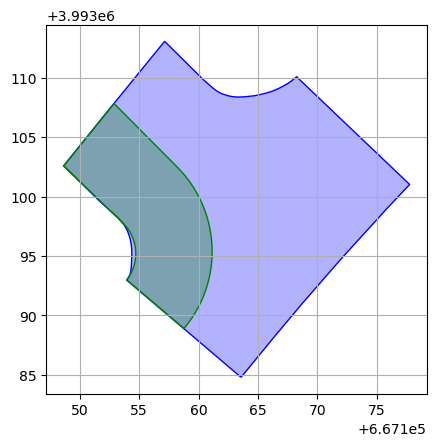

In [93]:
intersections = network_S.intersections
curr_intersection = intersections[4]
print(len(curr_intersection.connectingLanes))
plot_polygon(curr_intersection.polygon, add_points=False, color='blue')
plot_polygon(curr_intersection.connectingLanes[0].polygon, add_points=False, color='green')

In [8]:
for intersection in network_U.intersections[0:]:
    for connecting_lane in intersection.connectingLanes[:]:
        plot_polygon(connecting_lane.polygon, add_points=False, color='green')
    break
    

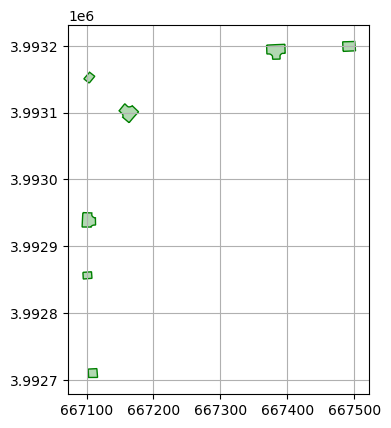

In [92]:
for lane in network_S.intersections:
    plot_polygon(lane.polygon, add_points=False, color='green')

In [51]:
create_realization_gif(realization)

/opt/anaconda3/envs/benchmark/lib/python3.8/site-packages/shapely/measurement.py:72: RuntimeWarning: overflow encountered in distance
  return lib.distance(a, b, **kwargs)
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


<Figure size 640x480 with 0 Axes>

In [10]:
-1 % 5

4

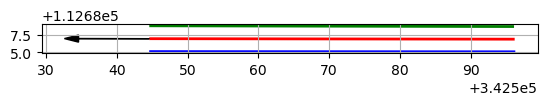

In [24]:
lane = network_U.lanes[0]


plot_line(lane.centerline.lineString, color='red', add_points=False)
plot_line(lane.leftEdge.lineString, color='blue', add_points=False)
plot_line(lane.rightEdge.lineString, color='green', add_points=False)

centerline_point = lane.centerline.lineString.coords[1]

orientation = lane.orientation.value(Vector(centerline_point[0]+ 10, centerline_point[1] + 100))

#plot the orientation vector with an arrow
import matplotlib.pyplot as plt
import numpy as np
plt.arrow(centerline_point[0], centerline_point[1], 10 * np.cos(orientation), 10 * np.sin(orientation), head_width=1, head_length=2, fc='k', ec='k')

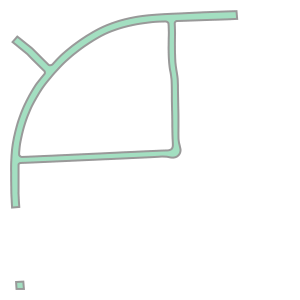

In [ ]:
network.drivableRegion.polygons

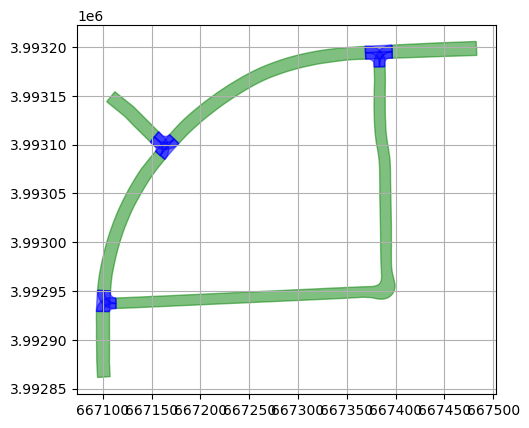

In [ ]:
for road in network.roads:
    plot_polygon(road.polygon, color='green', alpha=0.5, add_points=False)
for road in network.connectingRoads:
    plot_polygon(road.polygon, color='blue', alpha=0.5, add_points=False)

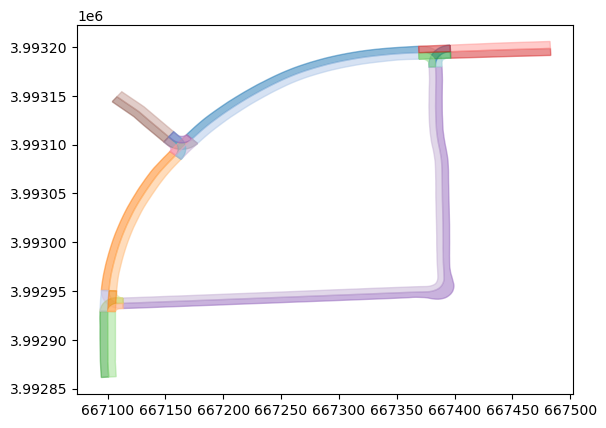

In [ ]:
# plot a different color for each lane group

import matplotlib.pyplot as plt

fig, ax = plt.subplots()
for i, lane in enumerate(network.laneGroups):
    color = plt.cm.tab20(i % 20)  # Use a colormap for distinct colors
    plot_polygon(lane.polygon, ax=ax, color=color, add_points=False, alpha=0.5)
plt.show()